In [2]:
# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import TensorBoard

# Helper libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

import time
import os
import cv2
print(tf.__version__)

%load_ext autoreload
%autoreload 2
%matplotlib inline
plt.rcParams['figure.figsize'] = [12, 10]

1.12.0


In [3]:
POS_TARGET_DIR = './data/processed/good'
NEG_TARGET_DIR = './data/processed/bad'
IMG_DIR = './data/processed'
T_WIDTH = 175
T_HEIGHT = 300

In [4]:
def load_images_from_path(path):
    ds = []
    for filename in os.listdir(path):
        img = cv2.imread(os.path.join(path, filename))
        img = cv2.resize(img, (T_WIDTH, T_HEIGHT))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ds.append(img)
    return ds

In [5]:
pos_images = load_images_from_path(POS_TARGET_DIR)
neg_images = load_images_from_path(NEG_TARGET_DIR)

In [ ]:
img.shape

In [ ]:
# img = cv2.cvtColor(neg_images[1844],cv2.COLOR_BGR2RGB)
img = neg_images[1844]
# img = cv2.resize(img, (175, 300))
plt.imshow(img)
plt.show()

In [6]:
image_input = tf.keras.Input(shape=(T_HEIGHT, T_WIDTH, 3), name='input_layer')

# Some convolutional layers
conv_1 = keras.layers.Conv2D(32,
                                kernel_size=(3, 3),
                                padding='same',
                                activation='relu')(image_input)
conv_1 = keras.layers.MaxPooling2D(padding='same')(conv_1)
conv_2 = keras.layers.Conv2D(32,
                                kernel_size=(3, 3),
                                padding='same',
                                activation='relu')(conv_1)
conv_2 = keras.layers.MaxPooling2D(padding='same')(conv_2)
conv_3 = keras.layers.Conv2D(32,
                                kernel_size=(3, 3),
                                padding='same',
                                activation='relu')(conv_1)
conv_3 = keras.layers.MaxPooling2D(padding='same')(conv_2)

# Flatten the output of the convolutional layers
conv_flat = keras.layers.Flatten()(conv_3)

# Some dense layers with two separate outputs
fc_1 = keras.layers.Dense(128,
                             activation='relu')(conv_flat)
fc_1 = keras.layers.Dropout(0.2)(fc_1)
fc_2 = keras.layers.Dense(64,
                             activation='relu')(fc_1)
fc_2 = keras.layers.Dropout(0.2)(fc_2)

# Output layers: separate outputs for the weather and the ground labels
output = keras.layers.Dense(1,
                            activation='sigmoid',
                            name='output')(fc_2)
model = tf.keras.Model(inputs=image_input, outputs=[output])

In [7]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     (None, 300, 175, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 300, 175, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 150, 88, 32)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 150, 88, 32)       9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 75, 44, 32)        0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 38, 22, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 26752)             0         
__________

In [8]:
sgd = keras.optimizers.SGD(lr=0.01, momentum=0.0, decay=0.0, nesterov=False)
adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)

model.compile(optimizer='adam',
              loss={'output': 'binary_crossentropy'},
              metrics=['accuracy'])
tensorboard = TensorBoard(log_dir="logs/{}".format(time.time()))


In [9]:
train_data_dir = IMG_DIR
img_width = T_WIDTH
img_height = T_HEIGHT
batch_size = 6496
nb_epochs = 4

train_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1./255,
    shear_range=0.2,
    zoom_range=0.1,
    horizontal_flip=True)
#     validation_split=0.2) # set validation split

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    subset='training') # set as training data

# validation_generator = train_datagen.flow_from_directory(
#     train_data_dir, # same directory as training data
#     target_size=(img_height, img_width),
#     batch_size=batch_size,
#     class_mode='binary',
#     subset='validation') # set as validation data

Found 10503 images belonging to 4 classes.


In [10]:
im = train_generator.next()

In [ ]:
im[0].shape

In [108]:
with tf.device('/gpu:0'):
    model.fit(im[0], im[1], batch_size=256, epochs=4, verbose=1)

Epoch 1/4
6496/6496 [==============================] - 12s 2ms/step - loss: 0.2005 - acc: 0.9186
Epoch 2/4
6496/6496 [==============================] - 12s 2ms/step - loss: 0.1196 - acc: 0.9544
Epoch 3/4
6496/6496 [==============================] - 11s 2ms/step - loss: 0.0494 - acc: 0.9849
Epoch 4/4
6496/6496 [==============================] - 12s 2ms/step - loss: 0.0215 - acc: 0.9938


In [61]:
labels = im[1]
images = im[0]

In [1]:
model.predict(im[0])

NameError: name 'model' is not defined

In [38]:
labels[1] == float(0)

True

In [46]:
labels = labels.astype(int)

In [65]:
np.where(labels == 0)

(array([   1,    3,    5, ..., 6493, 6494, 6495]),)

Id: 3849, Label: 0.0


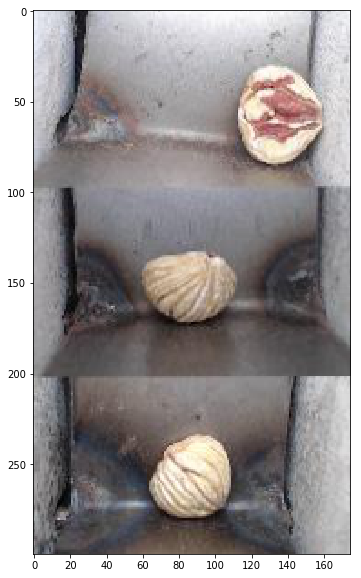

Id: 1334, Label: 0.0


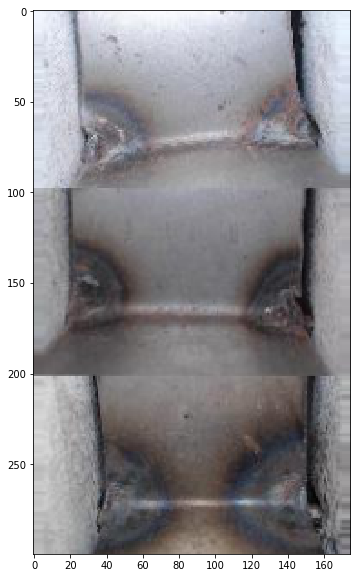

Id: 1710, Label: 0.0


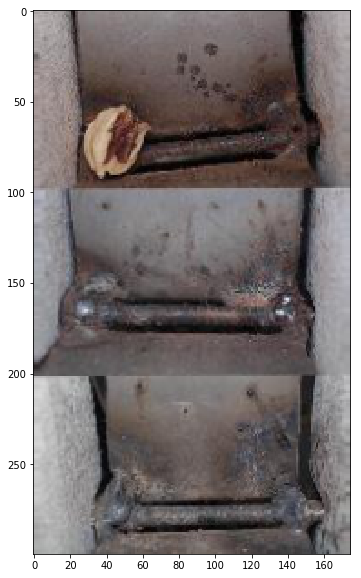

Id: 2415, Label: 0.0


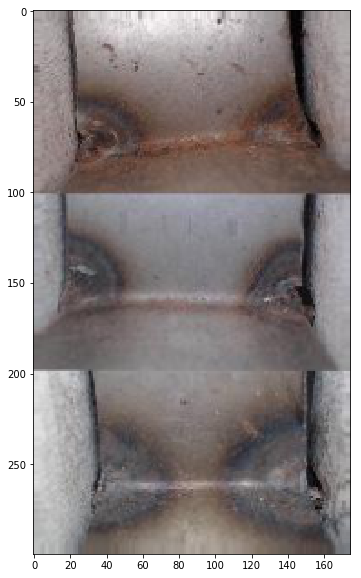

Id: 5202, Label: 0.0


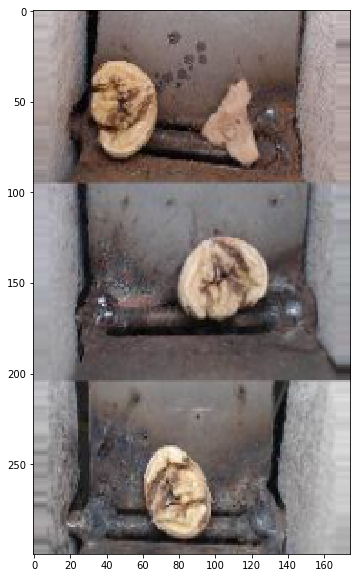

Id: 3874, Label: 0.0


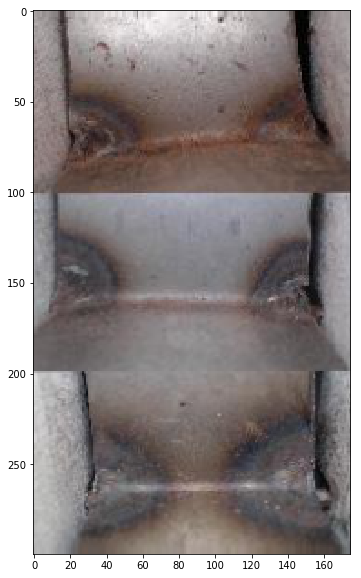

Id: 4185, Label: 0.0


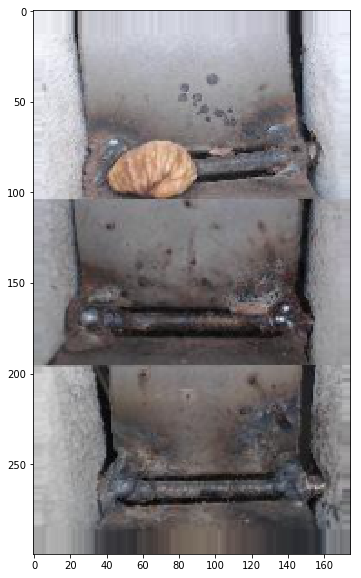

Id: 3062, Label: 0.0


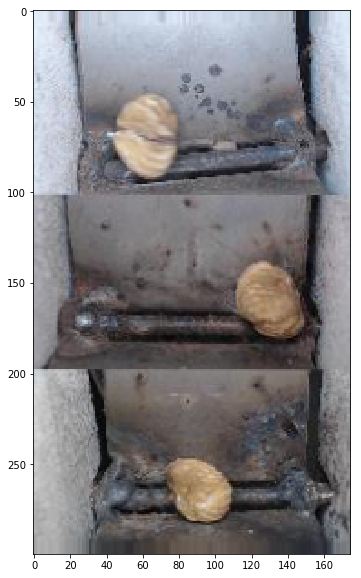

Id: 5590, Label: 0.0


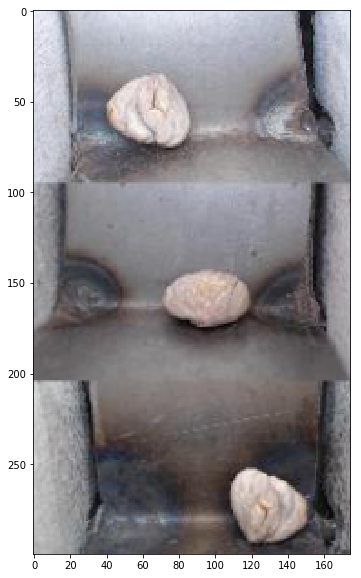

Id: 2441, Label: 0.0


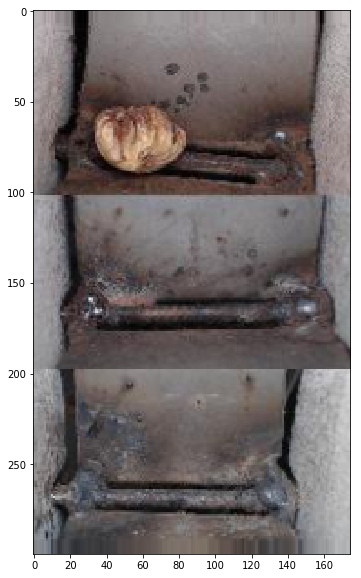

Id: 811, Label: 0.0


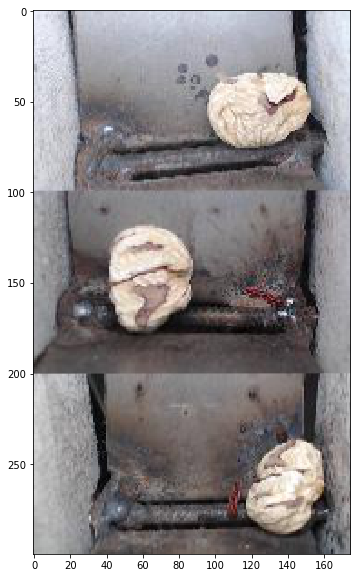

Id: 5131, Label: 0.0


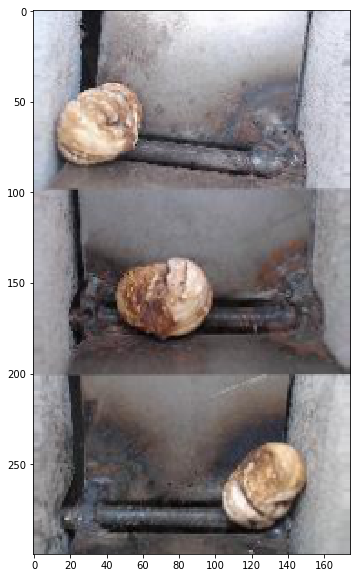

Id: 5229, Label: 0.0


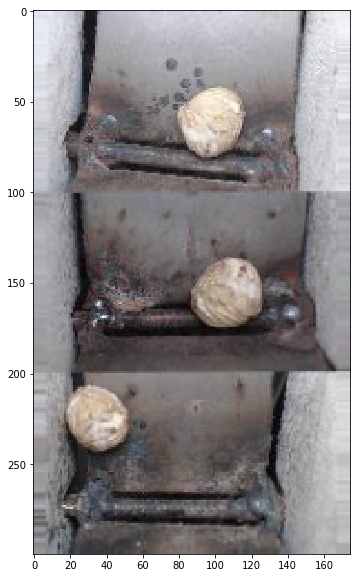

Id: 242, Label: 0.0


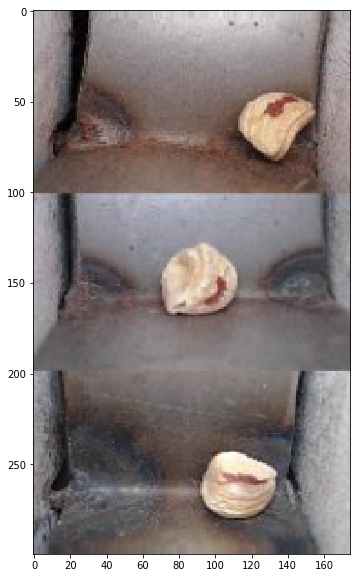

Id: 4591, Label: 0.0


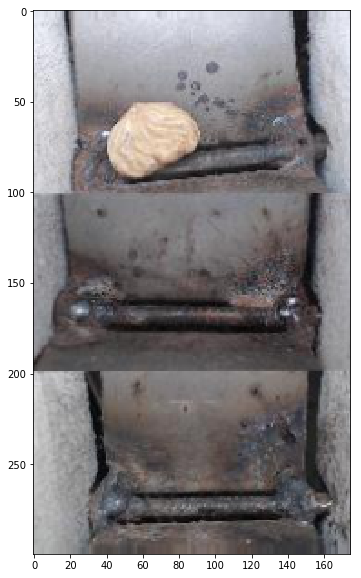

Id: 4077, Label: 0.0


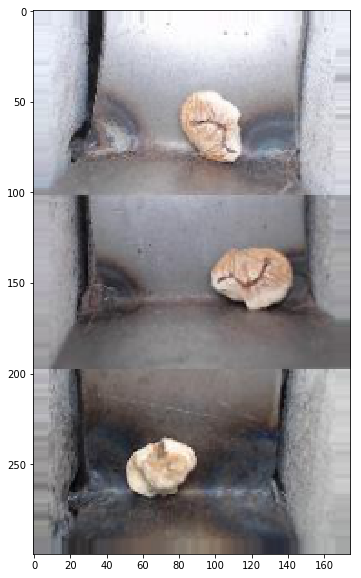

Id: 2289, Label: 0.0


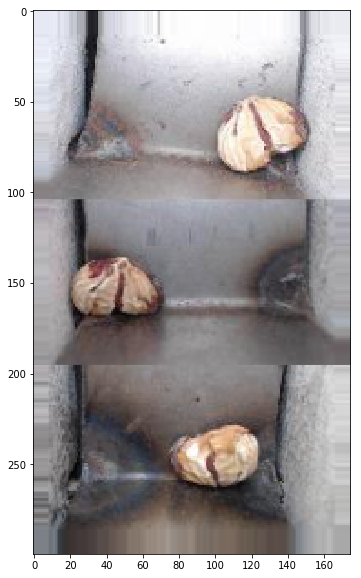

Id: 3426, Label: 0.0


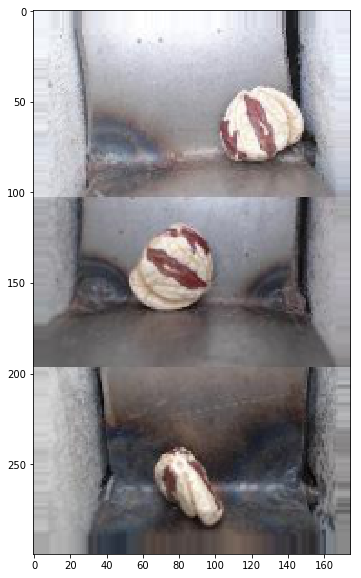

Id: 3097, Label: 0.0


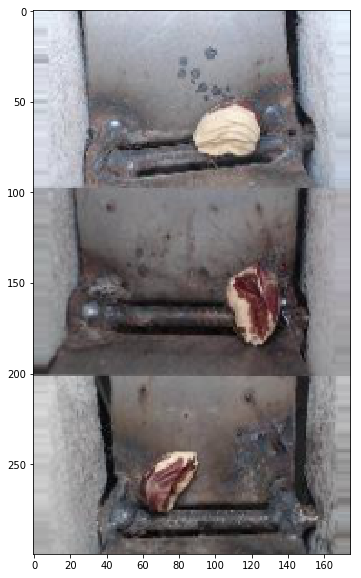

Id: 1600, Label: 0.0


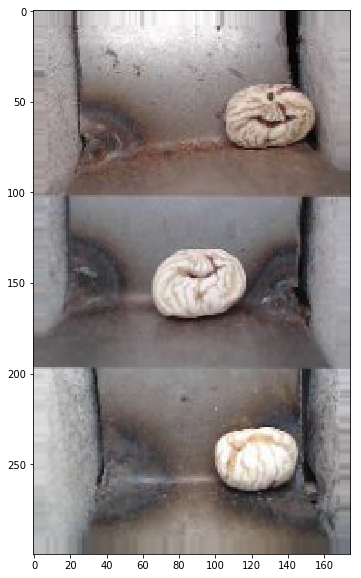

Id: 3576, Label: 0.0


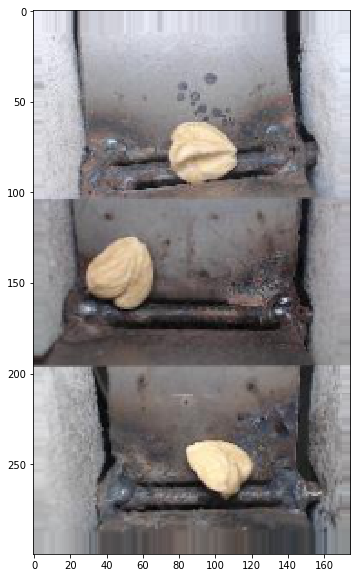

Id: 556, Label: 0.0


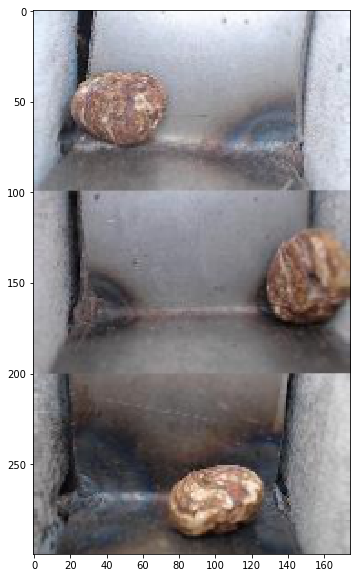

Id: 5404, Label: 0.0


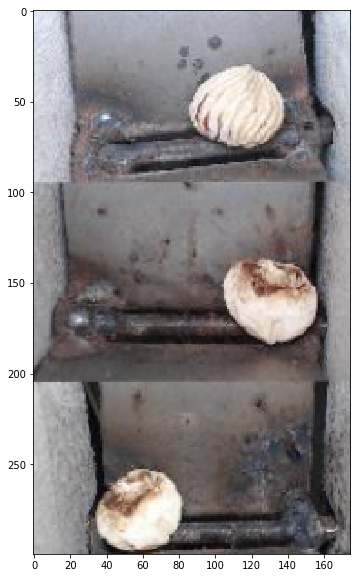

Id: 1964, Label: 0.0


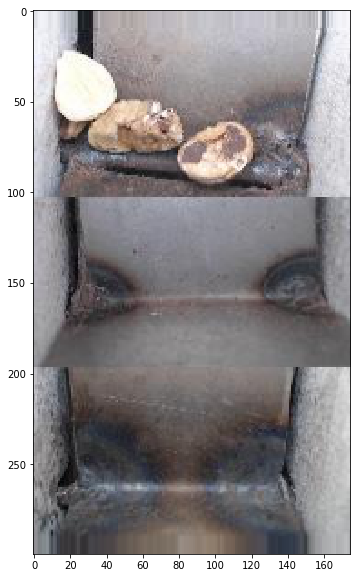

Id: 530, Label: 0.0


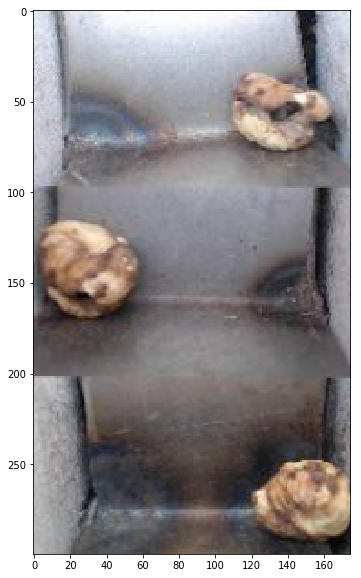

Id: 1845, Label: 0.0


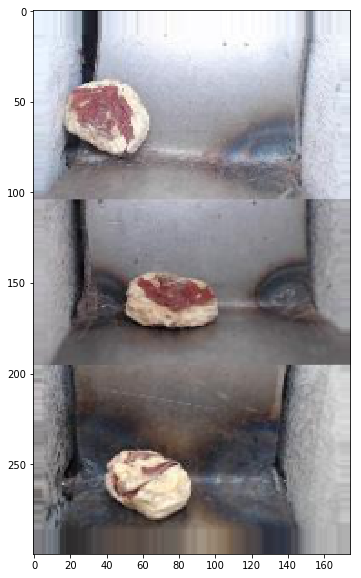

Id: 2995, Label: 0.0


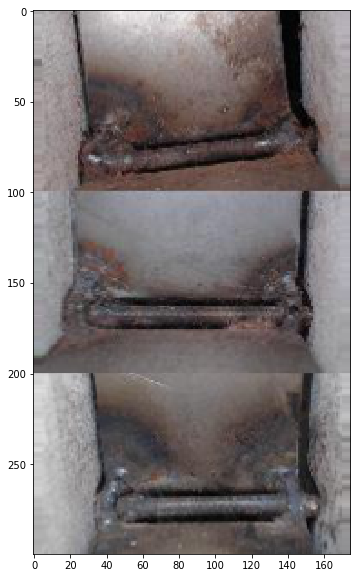

Id: 5560, Label: 0.0


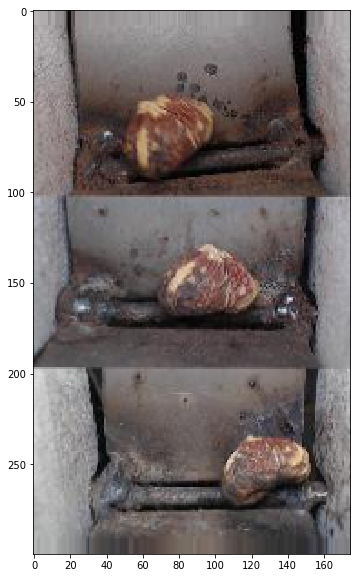

Id: 4782, Label: 0.0


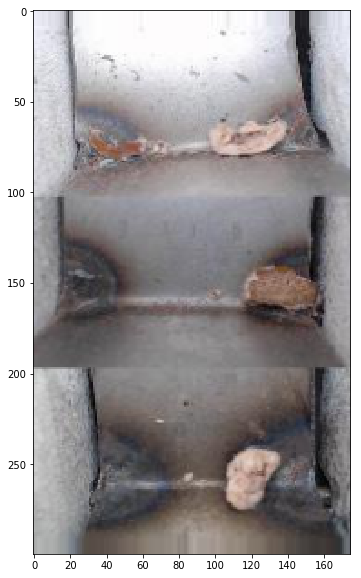

Id: 2294, Label: 0.0


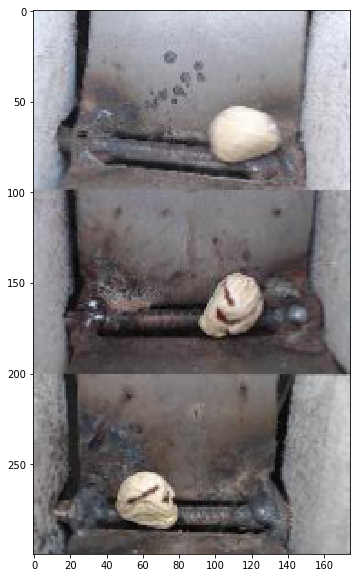

Id: 1524, Label: 0.0


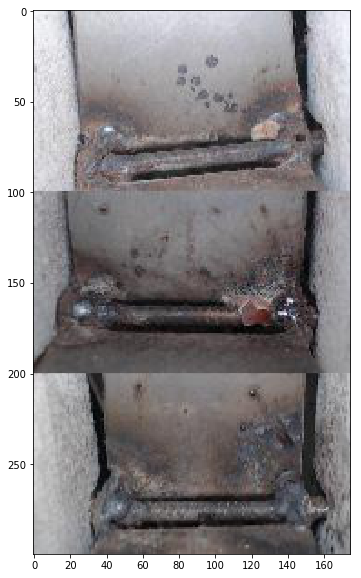

Id: 25, Label: 0.0


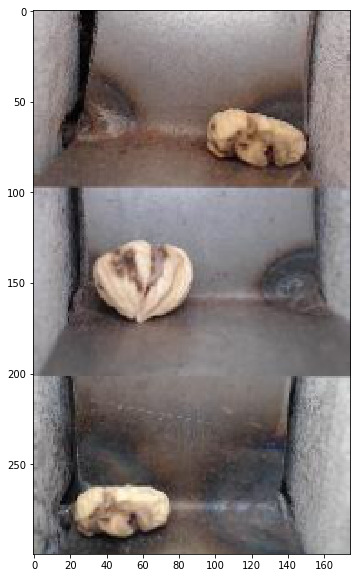

Id: 1394, Label: 0.0


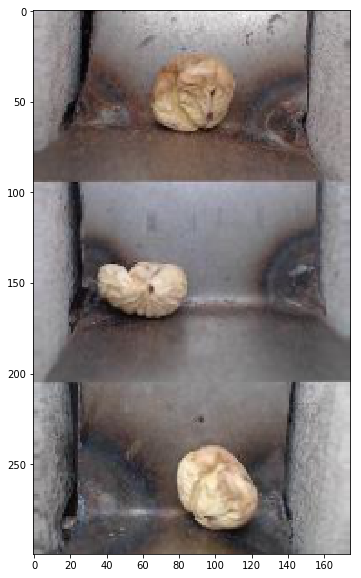

Id: 319, Label: 0.0


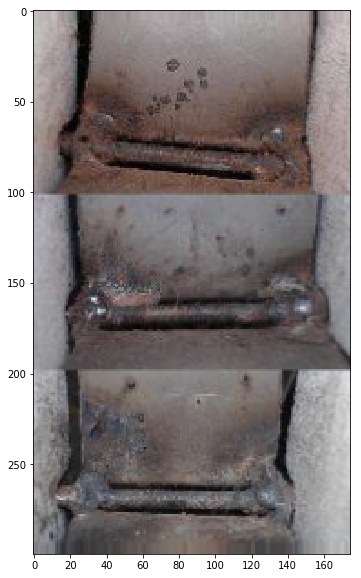

Id: 5251, Label: 0.0


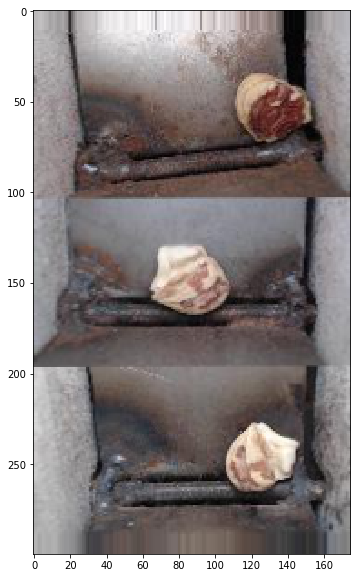

Id: 4190, Label: 0.0


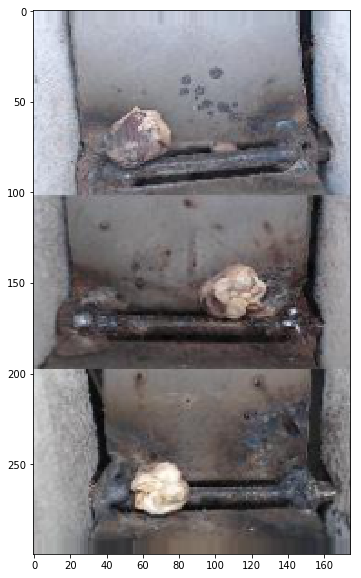

Id: 3850, Label: 0.0


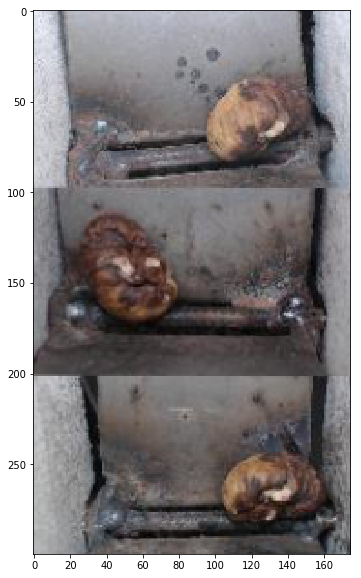

Id: 5396, Label: 0.0


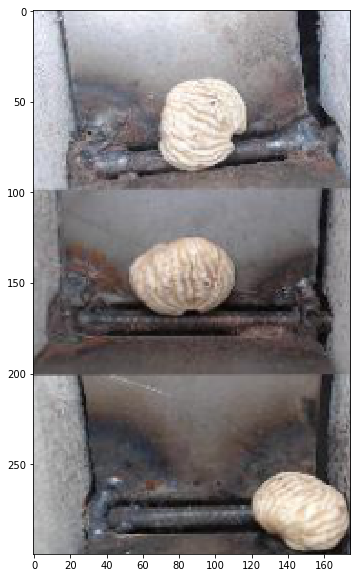

Id: 4236, Label: 0.0


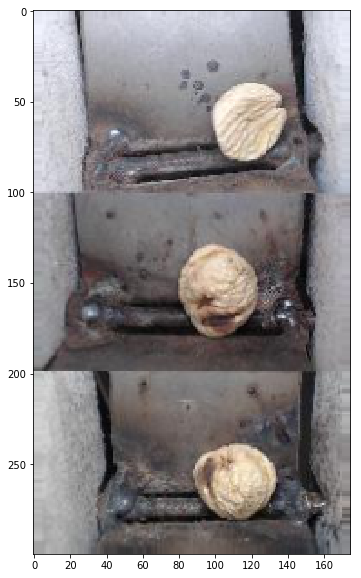

Id: 3777, Label: 0.0


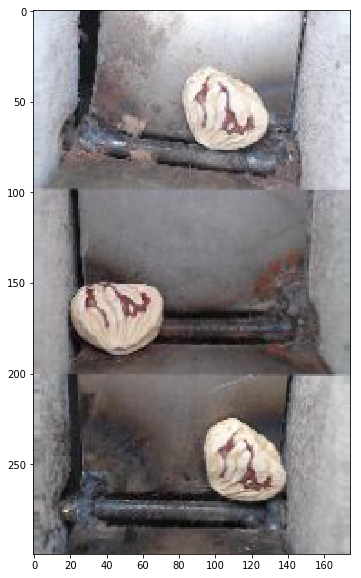

Id: 6023, Label: 0.0


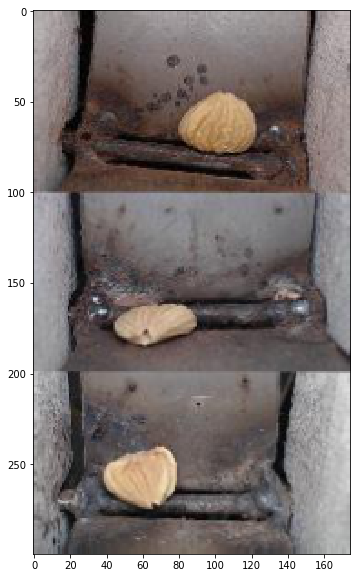

Id: 5965, Label: 0.0


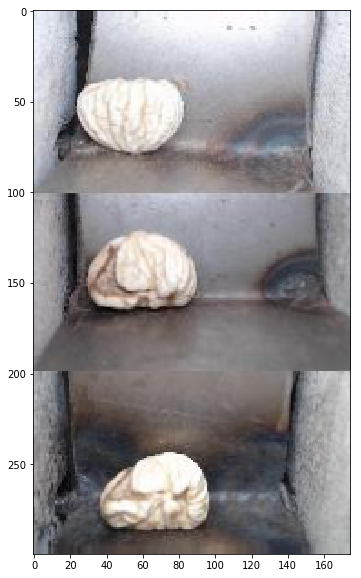

Id: 4670, Label: 0.0


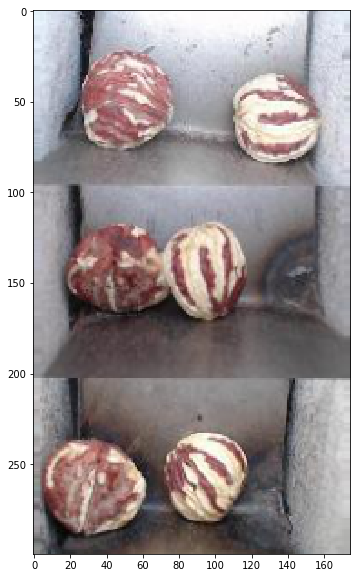

Id: 2135, Label: 0.0


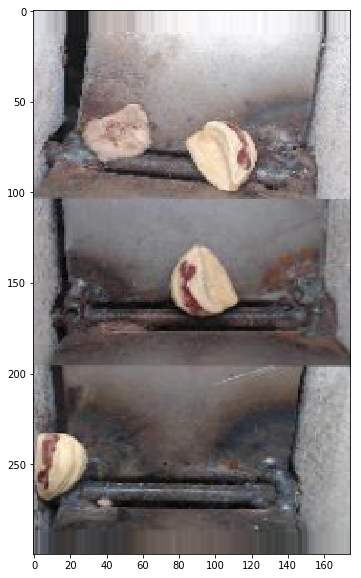

Id: 1608, Label: 0.0


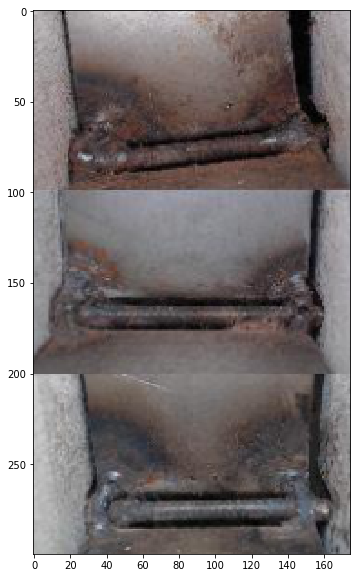

Id: 4455, Label: 0.0


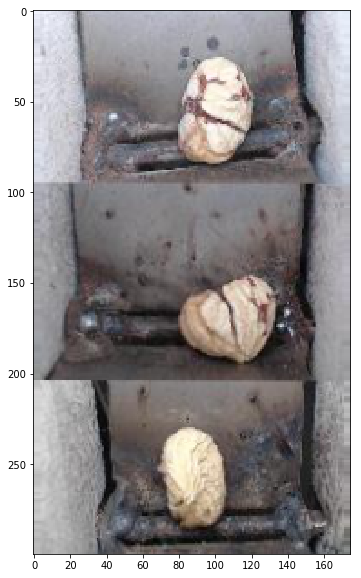

Id: 4877, Label: 0.0


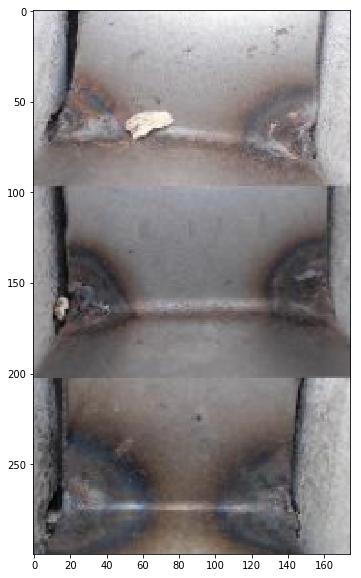

Id: 6429, Label: 0.0


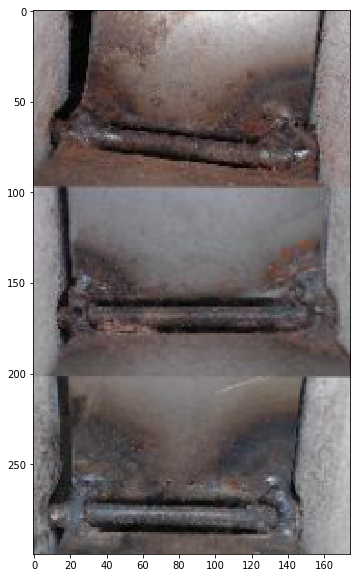

Id: 3779, Label: 0.0


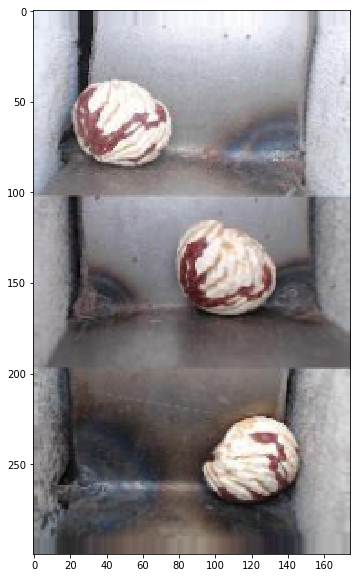

Id: 5857, Label: 0.0


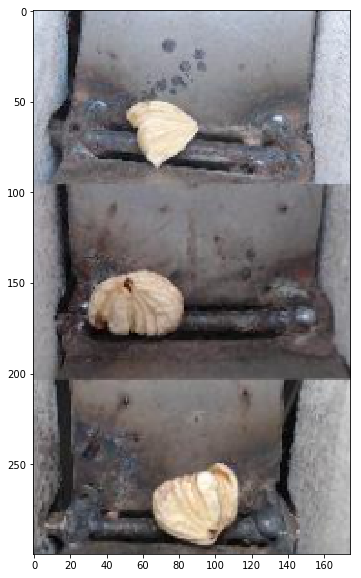

Id: 5757, Label: 0.0


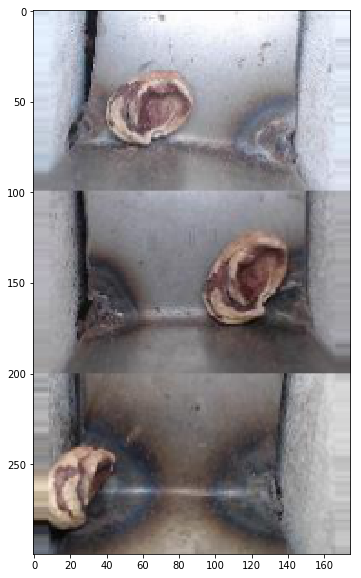

Id: 1529, Label: 0.0


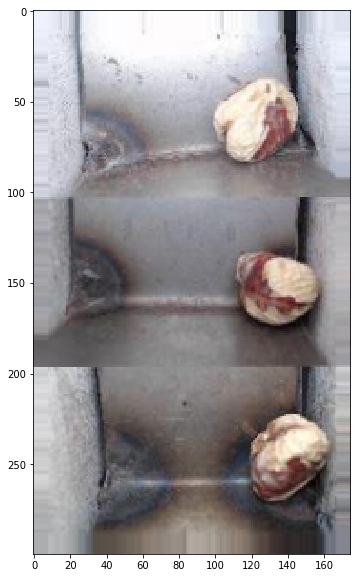

Id: 2074, Label: 0.0


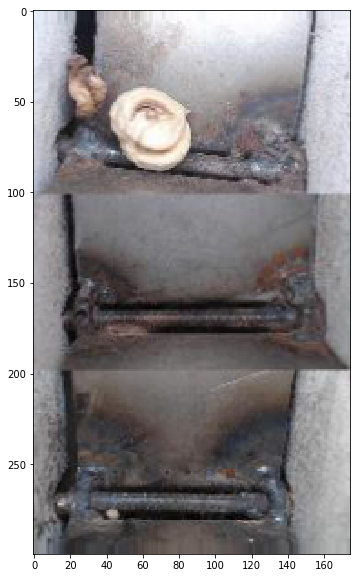

Id: 1984, Label: 0.0


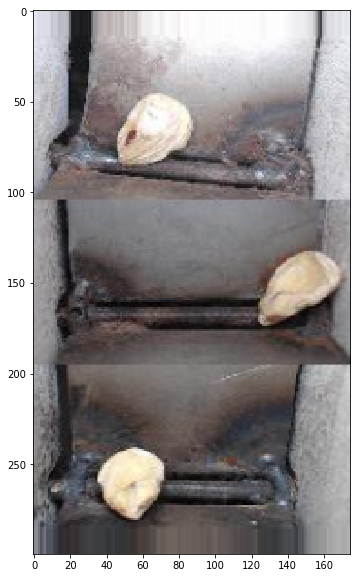

Id: 6133, Label: 0.0


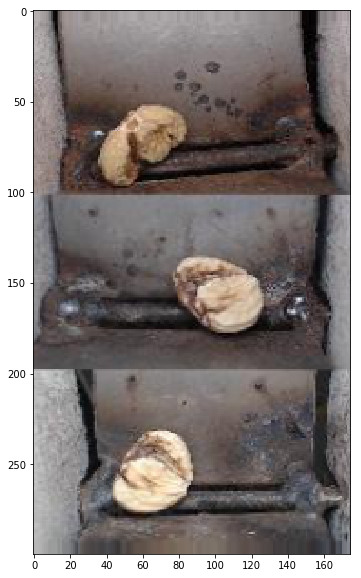

Id: 6368, Label: 0.0


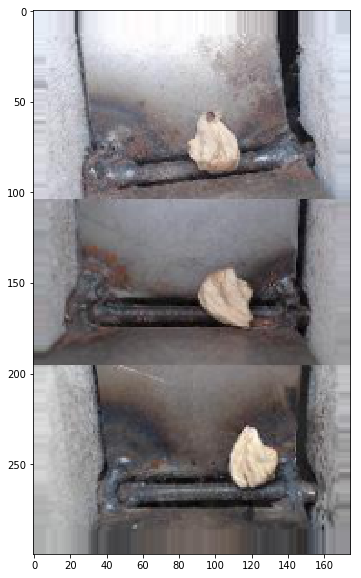

Id: 2877, Label: 0.0


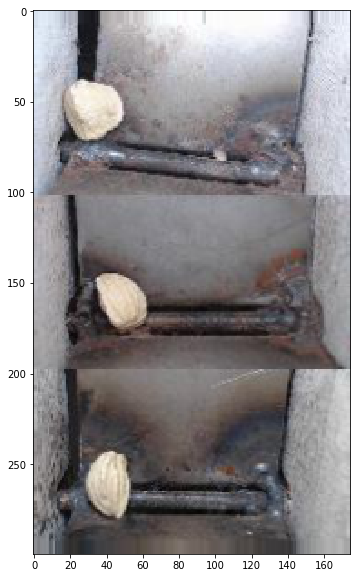

Id: 606, Label: 0.0


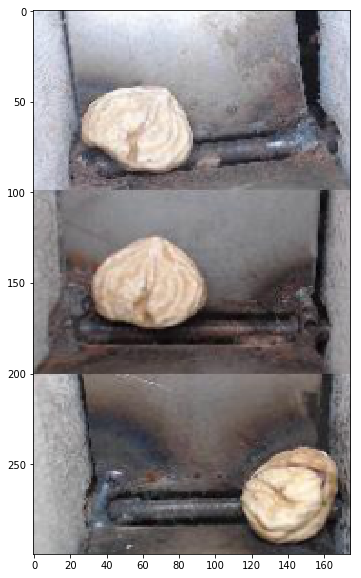

Id: 1781, Label: 0.0


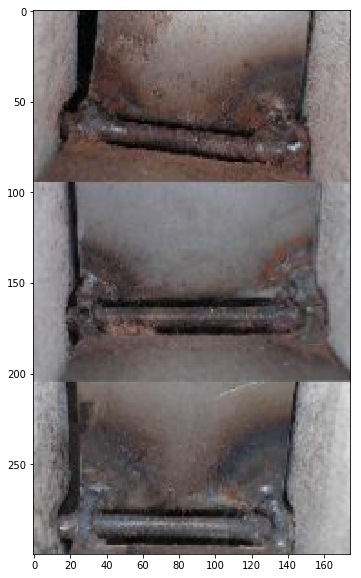

Id: 3519, Label: 0.0


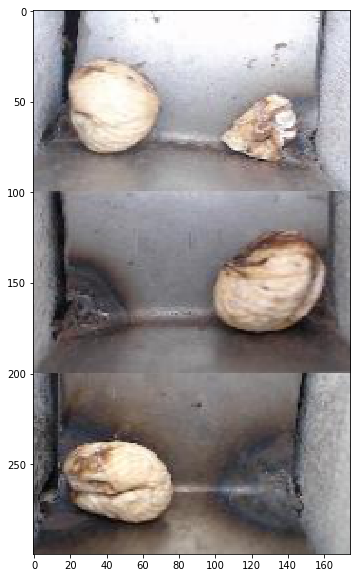

Id: 5207, Label: 0.0


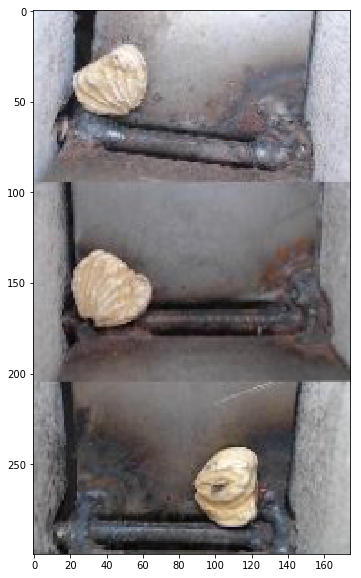

Id: 6430, Label: 0.0


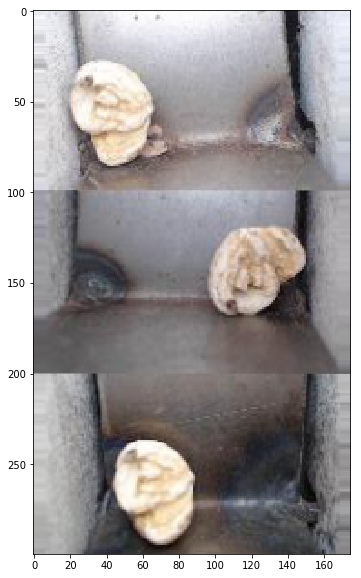

Id: 4161, Label: 0.0


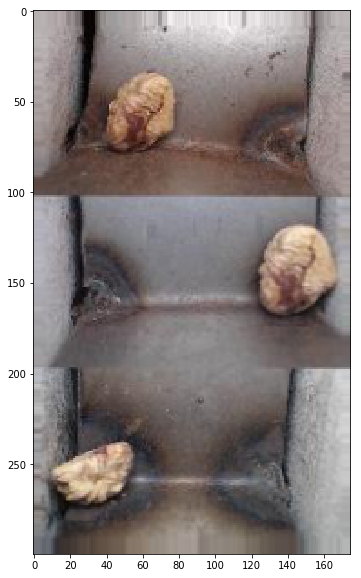

Id: 978, Label: 0.0


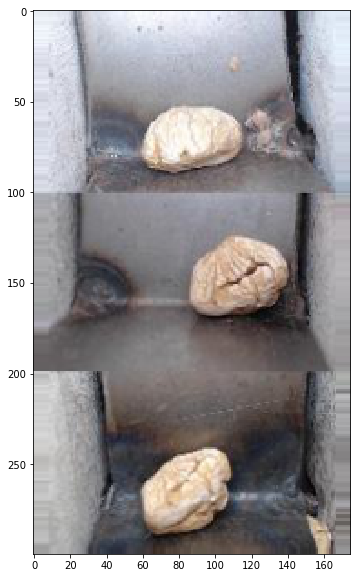

Id: 6067, Label: 0.0


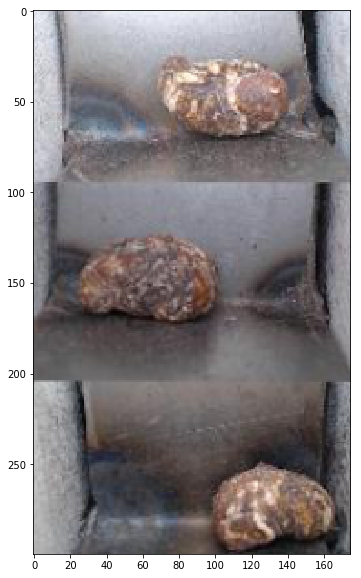

Id: 2004, Label: 0.0


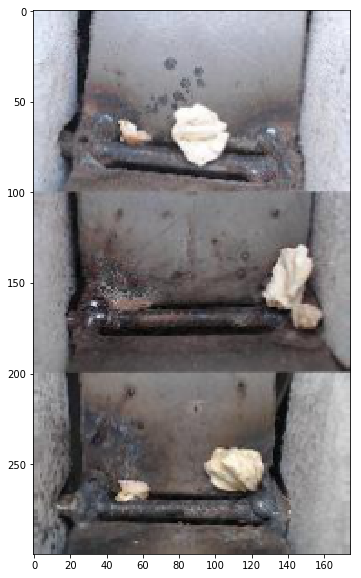

Id: 1586, Label: 0.0


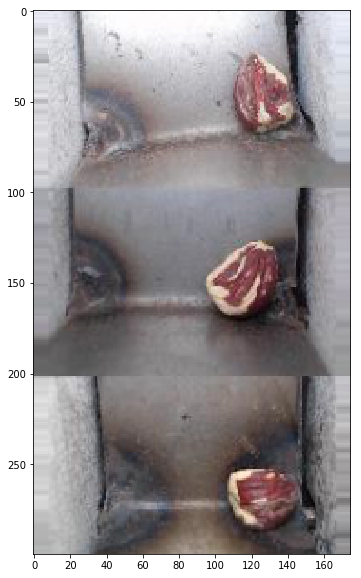

Id: 477, Label: 0.0


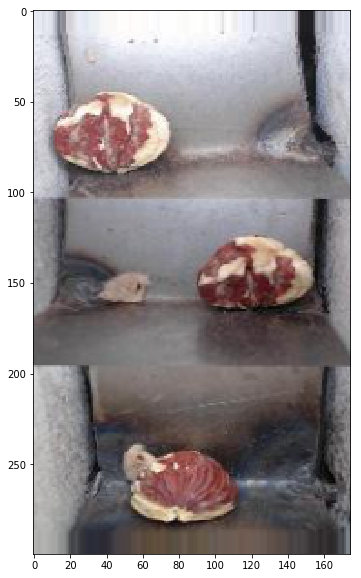

Id: 3005, Label: 0.0


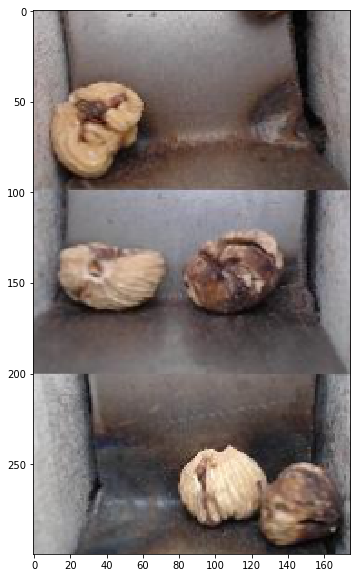

Id: 1653, Label: 0.0


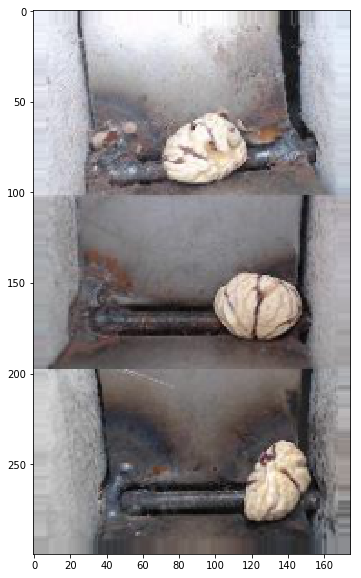

Id: 5690, Label: 0.0


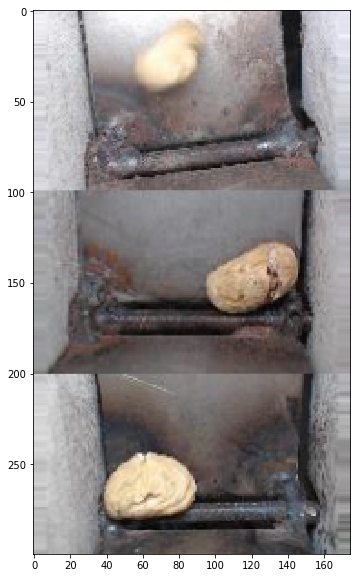

Id: 3720, Label: 0.0


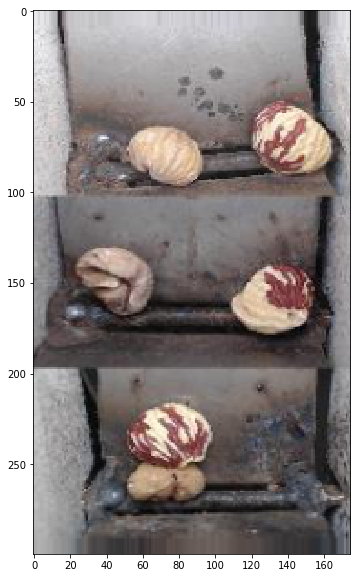

Id: 5022, Label: 0.0


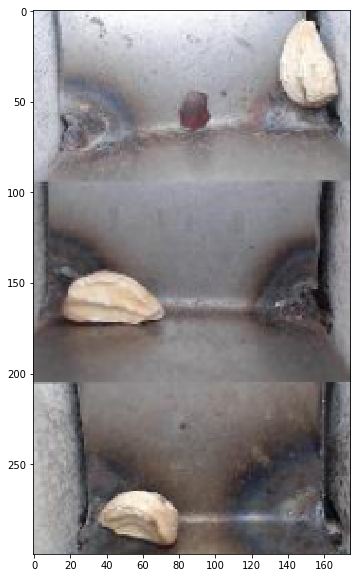

Id: 1018, Label: 0.0


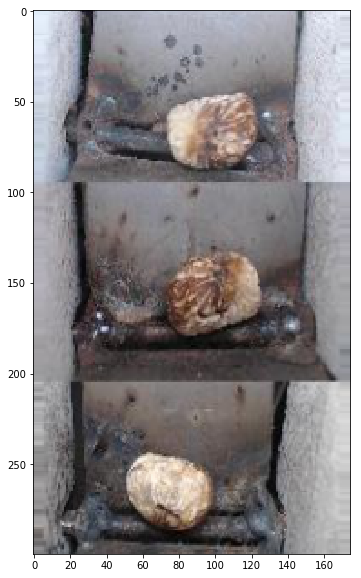

Id: 132, Label: 0.0


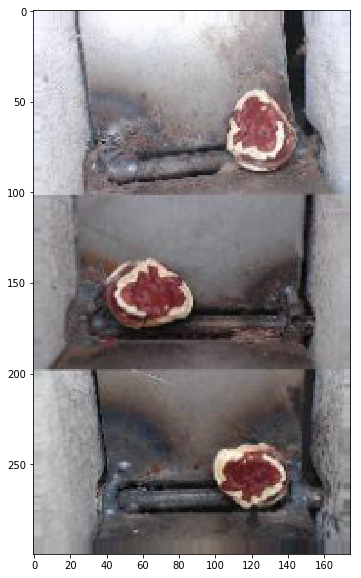

Id: 6047, Label: 0.0


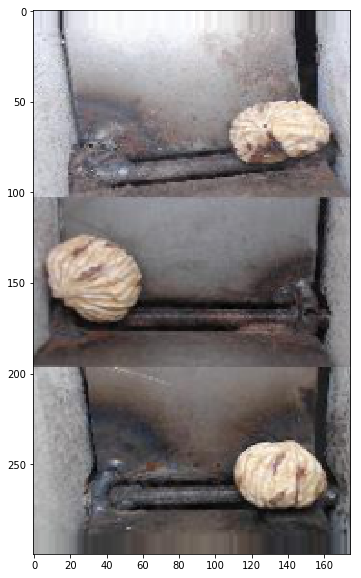

Id: 6377, Label: 0.0


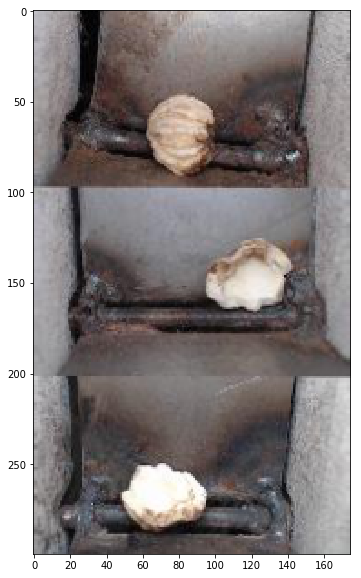

Id: 155, Label: 0.0


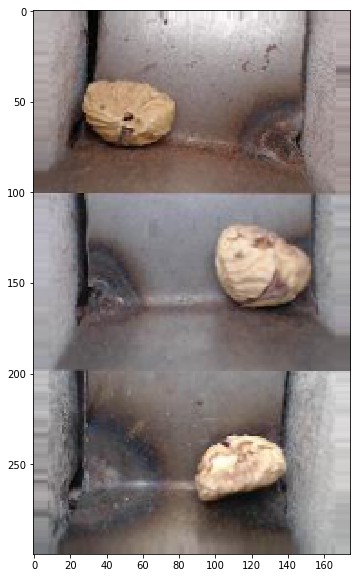

Id: 5719, Label: 0.0


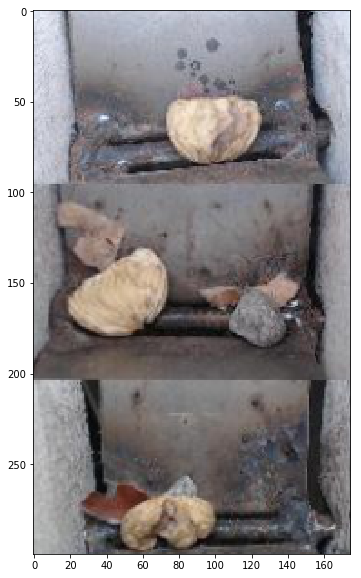

Id: 4986, Label: 0.0


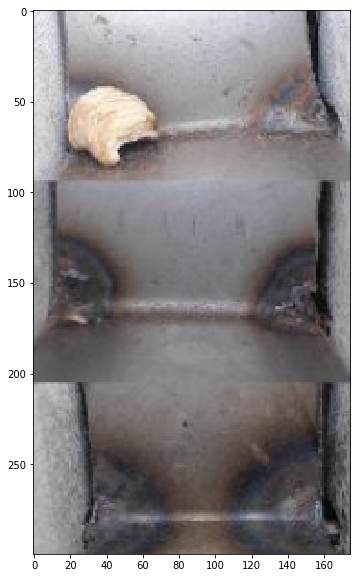

Id: 2320, Label: 0.0


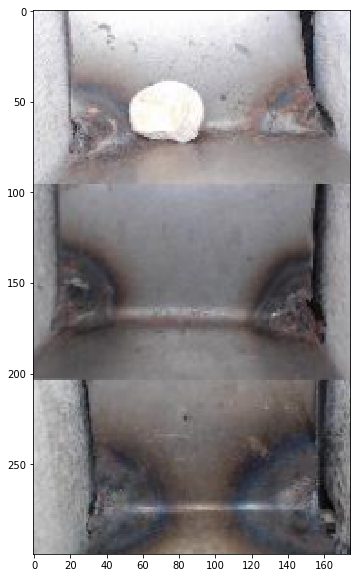

Id: 3118, Label: 0.0


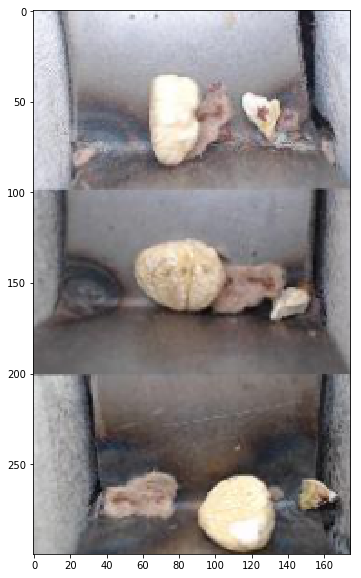

Id: 994, Label: 0.0


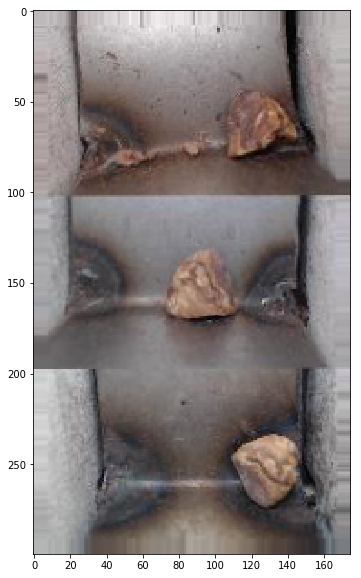

Id: 1621, Label: 0.0


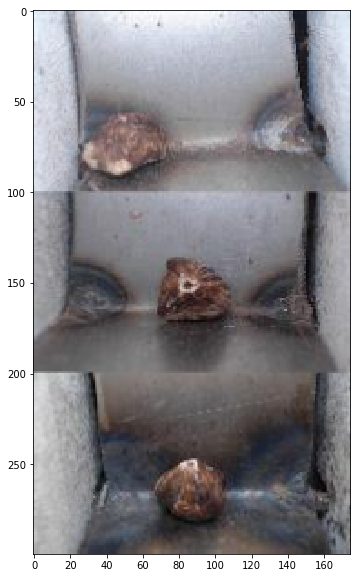

Id: 412, Label: 0.0


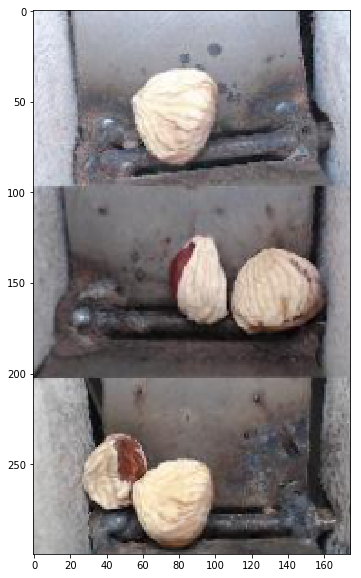

Id: 5176, Label: 0.0


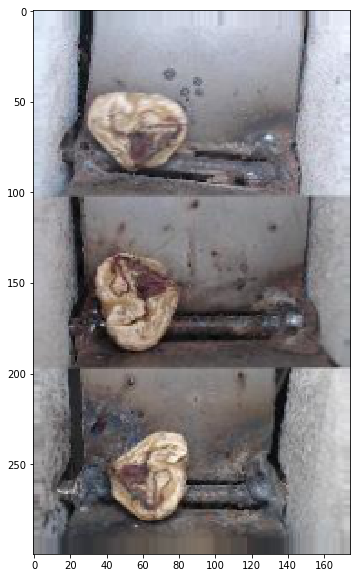

Id: 5016, Label: 0.0


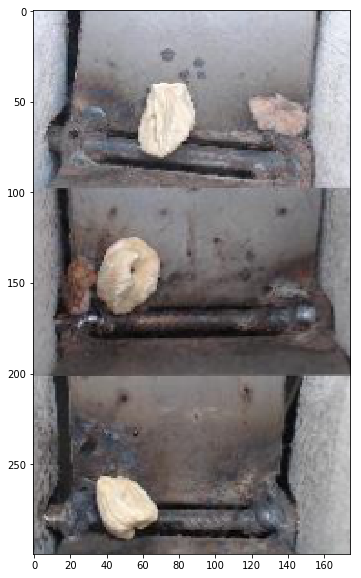

Id: 2089, Label: 0.0


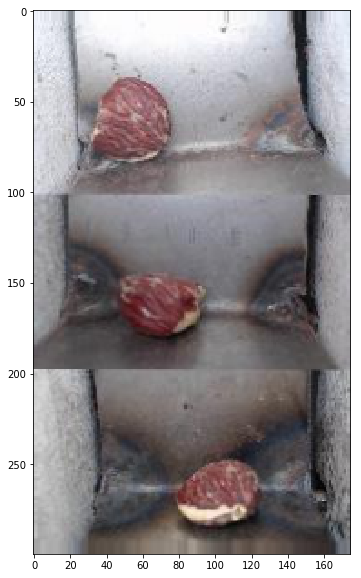

Id: 2653, Label: 0.0


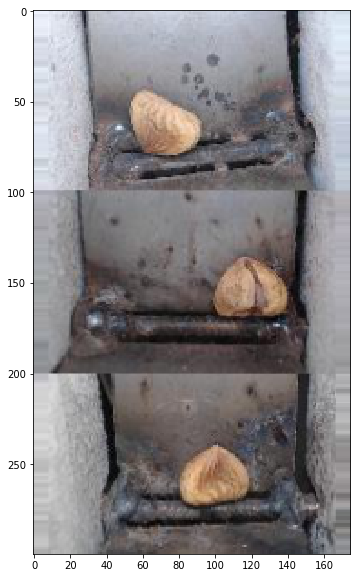

Id: 6456, Label: 0.0


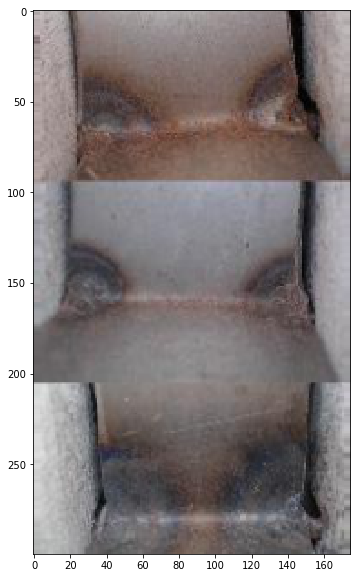

Id: 4184, Label: 0.0


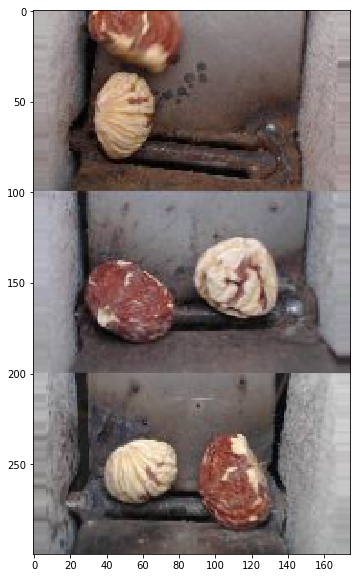

Id: 2155, Label: 0.0


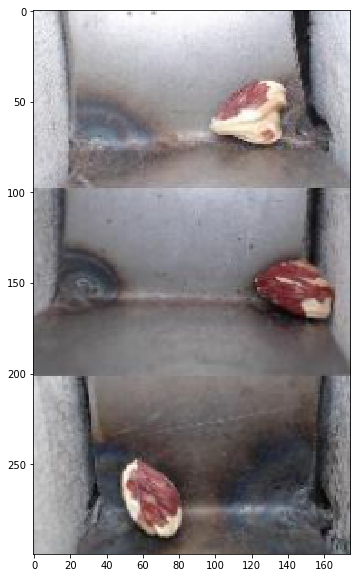

Id: 3943, Label: 0.0


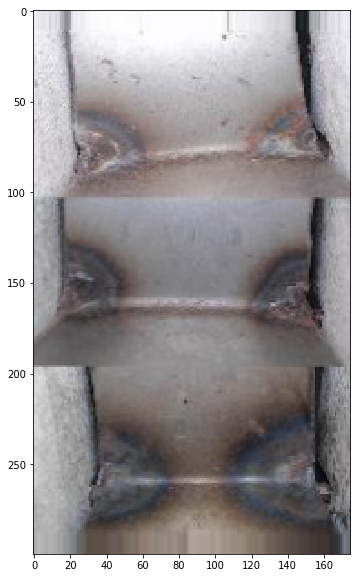

Id: 5085, Label: 0.0


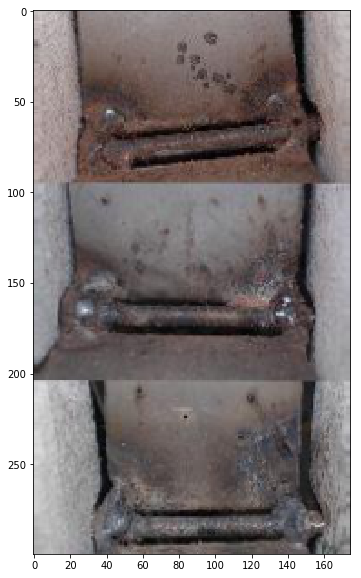

Id: 520, Label: 0.0


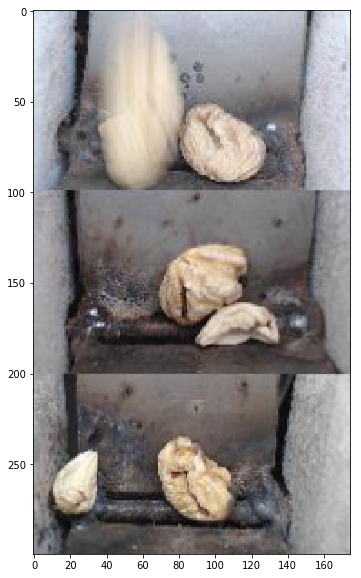

Id: 2718, Label: 0.0


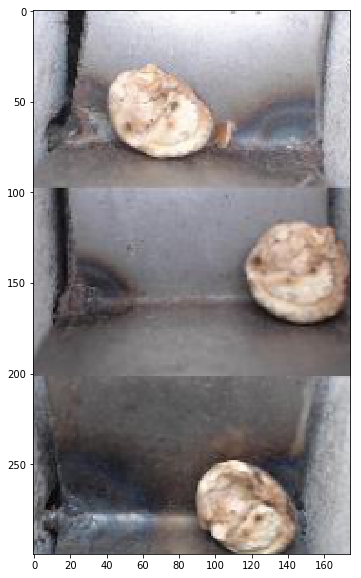

Id: 481, Label: 0.0


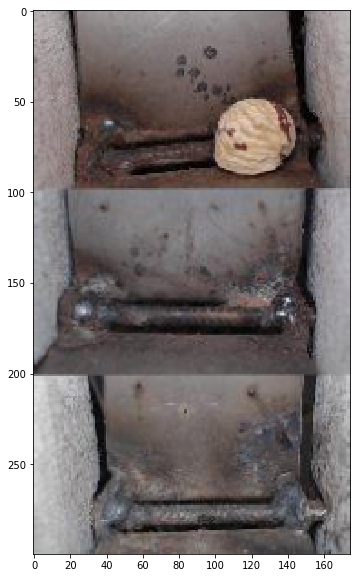

Id: 6441, Label: 0.0


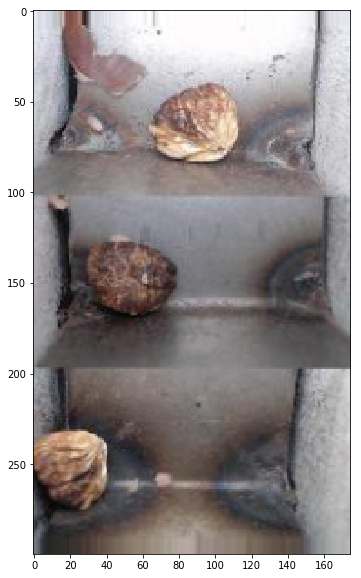

Id: 587, Label: 0.0


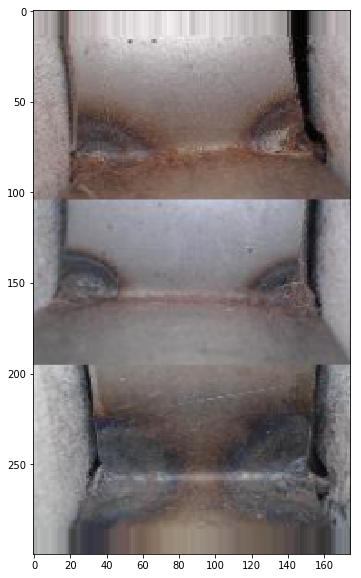

Id: 2039, Label: 0.0


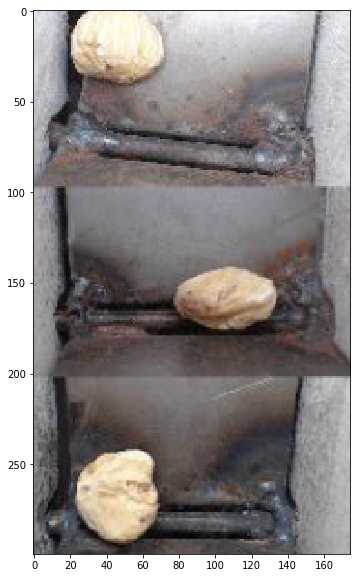

Id: 4277, Label: 0.0


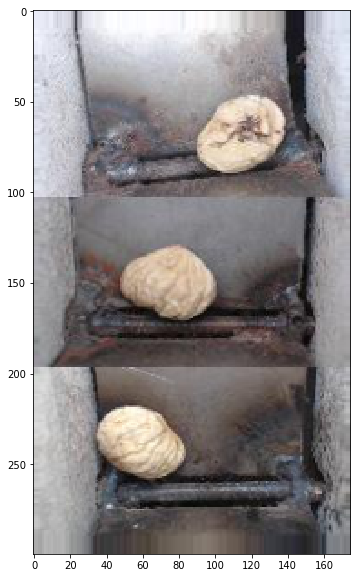

Id: 3046, Label: 0.0


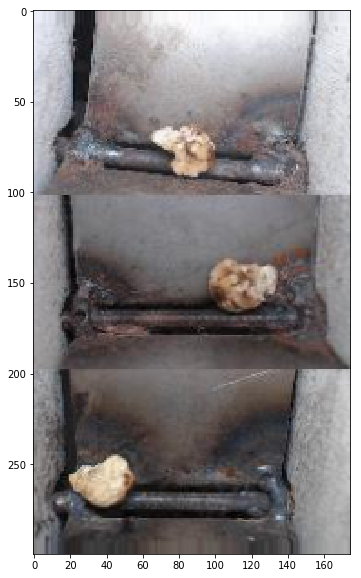

In [77]:
# Look at samples from each class
MAX = 100
label = 0
elements = np.where(labels == label)[0]
np.random.shuffle(elements)
for c, id in enumerate(elements):
    print("Id: {}, Label: {}".format(id, labels[id]))
    plt.imshow(images[id])
    plt.show()
    if c > MAX:
        break
    

In [ ]:
nb_epochs = 60

model.fit_generator(
    train_generator,
    steps_per_epoch = train_generator.samples // batch_size,
    validation_data = validation_generator, 
    validation_steps = validation_generator.samples // batch_size,
    epochs = nb_epochs,
    callbacks=[tensorboard])

In [1]:
import tensorflow as tf
with tf.device('/gpu:0'):
    a = tf.constant([1.0, 2.0, 3.0, 4.0, 5.0, 6.0], shape=[2, 3], name='a')
    b = tf.constant([1.0, 2.0, 3.0, 4.0, 5.0, 6.0], shape=[3, 2], name='b')
    c = tf.matmul(a, b)

with tf.Session() as sess:
    print (sess.run(c))

[[22. 28.]
 [49. 64.]]


In [11]:
with tf.Session() as sess:
  devices = sess.list_devices()

In [12]:
devices

[_DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 268435456, 5912014511634938843),
 _DeviceAttributes(/job:localhost/replica:0/task:0/device:XLA_GPU:0, XLA_GPU, 17179869184, 3404796069078072104),
 _DeviceAttributes(/job:localhost/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 17179869184, 6244570994117011130),
 _DeviceAttributes(/job:localhost/replica:0/task:0/device:GPU:0, GPU, 9398773351, 15491894532527142734)]

In [111]:
K.clear_session()

In [3]:
import tqdm
import time
for i in tqdm.tqdm(range(100)):
    time.sleep(1)


  8%|▊         | 8/100 [00:08<01:32,  1.00s/it]

KeyboardInterrupt: 